## Lab2 Machine Learning Balumatkina DA-01

### Task:
1) Провести EDA на таблицях "application_{train|test}.csv": про що дані, які розподіли колонок, скільки відсутніх значень, наскільки збалансовані дані, яким чином обробити відсутні дані, яка різниця між train та test наборами даних.

2) Побудувати класифікатор на основі проаналізованих даних (будь-який відомий метод). Для оцінки якості натренованої моделі використати train-validation split. Метрика для використання - ROC_AUC.

3) Класифікувати дані з файла "application_test.csv", записати результат в файл "sample_submission.csv".

4) Завантажити створений файл на платформу, з якого було отримано набори даних, та отримати оцінку.

#### Отож, для виконання даної лабораторної роботи потрібно спочатку проаналізувати отримані дані:
- Наскільки багато в наборах даних відсутніх значень. Залежно від їхньої кількості, можна або видалити стовпці/рядки з відсутніми значеннями (у випадку, якщо процент відсутності даних невеликий), або можна заповнити відсутні дані найпоширенішим методом - середнім значенням по ряду (для великого проценту відсутніх даних).

- Дослідити дані на наявність дублювань даних. У випадку їх наявності, проаналізувати отримані датасети, оскільки дублювання може бути обумовлене методом формування набору даних, в такому випадку з дублюваннями робити нічого не варто. Однак у випадку, якщо дублювання не мають бути присутніми в наборі даних, необхідно буде залишити лише один зі знайдених екземплярів.

- Дослідити набір даних на наявність категоріальних даних, складних до обробки для машини, хоч і зрозумілі для людини. У випадку наявності таких даних, необхідно буде закодувати у формат, звичний для більшості алгоритмів машинного навчання, використовуючи, до прикладу, підхід Label Encoding або One-Hot Encoding.

- Дослідити дані на наявність кореляцій між особливостями кожного набору даних для виведення коректної матриці кореляцій датасету.

#### Підключення бібліотек та початковий аналіз датасетів

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

trainDataset = pd.read_csv('application_train.csv')
testDataset = pd.read_csv('application_test.csv')

In [49]:
print(f"TRAIN dataset rows and collumns: {trainDataset.shape}")

TRAIN dataset rows and collumns: (307511, 122)


In [50]:
print(f"TEST dataset rows and collumns: {testDataset.shape}")

TEST dataset rows and collumns: (48744, 121)


Одразу помічаємо, що в наборі даних для тренування зазначено більшу кількість стовпців. Спробуємо вивести екземпляри даних з кожного датасету та знайти "додаткову" властивість.

In [51]:
print("TRAIN dataset looks like:")
trainDataset.head()

TRAIN dataset looks like:


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [52]:
print("TEST dataset looks like:")
testDataset.head()

TEST dataset looks like:


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


Помітно, що "додатковою" колонкою є TARGET: 2,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)".

#### Перевіримо дублювання

In [53]:
print(f"duplicates in TRAIN dataset: {trainDataset.duplicated().sum()}")
print(f"duplicates in TEST dataset: {testDataset.duplicated().sum()}")

duplicates in TRAIN dataset: 0
duplicates in TEST dataset: 0


Дублювання даних виявлено не було, тож нам не треба нічого робити для вирішення даної проблеми.

#### Типи змінних з датасетів

In [54]:
print("datatypes from TRAIN dataset:")
trainDataset.dtypes

datatypes from TRAIN dataset:


SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

Важливо одразу помітити, що вже присутні дані типу object, це не надто гарні новини про наявність категоричних даних, які потрібно буде приводити до числових для ефективної на них роботи алгоритмів машинного навчання.

In [55]:
print("datatypes from TEST dataset:")
testDataset.dtypes

datatypes from TEST dataset:


SK_ID_CURR                      int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 121, dtype: object

In [56]:
categoricData = trainDataset.select_dtypes(include=['object']).columns
print(f"TRAIN dataset categorical features list: {categoricData}")

TRAIN dataset categorical features list: Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')


Як було згадано раніше, тепер, знаючи, які властивості датасетів в нас відносяться до категоріальних даних, необхідно їх закодувати.

In [57]:
from sklearn.preprocessing import LabelEncoder
labelenc = LabelEncoder()

for col in trainDataset:
    if trainDataset[col].dtype == 'object':
        if len(list(trainDataset[col].unique())) <= 2:
            trainDataset[col] = labelenc.fit_transform(trainDataset[col])
            testDataset[col] = labelenc.transform(testDataset[col])

#converting categoric to indicator
trainDataset = pd.get_dummies(trainDataset)
testDataset = pd.get_dummies(testDataset)

tempTarg = trainDataset["TARGET"]
trainDataset, testDataset = trainDataset.align(testDataset, join = 'inner', axis=1)
trainDataset["TARGET"] = tempTarg

print(f"new TRAIN dataset size for rows and collumns: {trainDataset.shape}")
print(f"new TEST dataset size for rows and collumns: {testDataset.shape}")

new TRAIN dataset size for rows and collumns: (307511, 240)
new TEST dataset size for rows and collumns: (48744, 239)


#### Відсутні значення та вирішення їх проблеми

In [58]:
def countMissingDataPercent(data):
    percentages = pd.DataFrame((data.isnull().sum() / data.shape[0] * 100).sort_values(ascending=True))
    percentages.columns = ['%']
    return percentages

print("empty values percentages in TRAIN dataset")
countMissingDataPercent(trainDataset)

empty values percentages in TRAIN dataset


,%
SK_ID_CURR,0.000000
OCCUPATION_TYPE_Private service staff,0.000000
OCCUPATION_TYPE_Realty agents,0.000000
OCCUPATION_TYPE_Sales staff,0.000000
OCCUPATION_TYPE_Secretaries,0.000000
...,...
NONLIVINGAPARTMENTS_MODE,69.432963
NONLIVINGAPARTMENTS_AVG,69.432963
COMMONAREA_MODE,69.872297
COMMONAREA_AVG,69.872297


In [59]:
print("empty values percentages in TEST dataset")
countMissingDataPercent(testDataset)

empty values percentages in TEST dataset


,%
SK_ID_CURR,0.000000
OCCUPATION_TYPE_Medicine staff,0.000000
OCCUPATION_TYPE_Private service staff,0.000000
OCCUPATION_TYPE_Realty agents,0.000000
OCCUPATION_TYPE_Sales staff,0.000000
...,...
NONLIVINGAPARTMENTS_AVG,68.412523
NONLIVINGAPARTMENTS_MEDI,68.412523
COMMONAREA_AVG,68.716150
COMMONAREA_MEDI,68.716150


В обох наборах даних процент відсутніх значень в деяких полях вища за 50%. Вирішення даної проблеми видаленням записів може призвести до спотворення першочергово отриманого датасету, тому спробуємо заповнити пропущені значення.

In [60]:
from sklearn.impute import SimpleImputer
tempTarg = trainDataset["TARGET"]
trainDataset = trainDataset.drop(columns=["TARGET"])
meanImpute = SimpleImputer(strategy='mean')
trainDataset = pd.DataFrame(meanImpute.fit_transform(trainDataset), columns = trainDataset.columns)
testDataset = pd.DataFrame(meanImpute.transform(testDataset), columns = testDataset.columns)
trainDataset["TARGET"] = tempTarg

print("empty values check for TRAIN dataset (no need in percents): ")
trainDataset.isnull().sum()

empty values check for TRAIN dataset (no need in percents): 


SK_ID_CURR                         0
NAME_CONTRACT_TYPE                 0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
                                  ..
WALLSMATERIAL_MODE_Stone, brick    0
WALLSMATERIAL_MODE_Wooden          0
EMERGENCYSTATE_MODE_No             0
EMERGENCYSTATE_MODE_Yes            0
TARGET                             0
Length: 240, dtype: int64

In [61]:
print("empty values check for TEST dataset (no need in percents): ")
testDataset.isnull().sum()

empty values check for TEST dataset (no need in percents): 


SK_ID_CURR                         0
NAME_CONTRACT_TYPE                 0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
                                  ..
WALLSMATERIAL_MODE_Panel           0
WALLSMATERIAL_MODE_Stone, brick    0
WALLSMATERIAL_MODE_Wooden          0
EMERGENCYSTATE_MODE_No             0
EMERGENCYSTATE_MODE_Yes            0
Length: 239, dtype: int64

#### Статистика та розподіли

In [62]:
print("TRAIN dataset stats:")
trainDataset.describe()

TRAIN dataset stats:


,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,TARGET
count,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307511.000000,3.075110e+05,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.095213,0.340108,0.693673,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,...,0.030090,0.007466,0.005785,0.005284,0.214757,0.210773,0.017437,0.518446,0.007570,0.080729
std,102790.175348,0.293509,0.473746,0.460968,0.722121,2.371231e+05,4.024908e+05,14493.454517,3.692794e+05,0.013831,...,0.170835,0.086085,0.075840,0.072501,0.410654,0.407858,0.130892,0.499660,0.086679,0.272419
min,100002.000000,0.000000,0.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,367142.500000,0.000000,1.000000,1.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,456255.000000,1.000000,1.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [63]:
print("TEST dataset stats:")
testDataset.describe()

TEST dataset stats:


,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
count,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48744.000000,4.874400e+04,48744.000000,...,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000
mean,277796.676350,0.009006,0.337129,0.690505,0.397054,1.784318e+05,5.167404e+05,29425.099064,4.626188e+05,0.021226,...,0.004185,0.029296,0.007242,0.005929,0.005826,0.231187,0.214057,0.016289,0.537071,0.007303
std,103169.547296,0.094474,0.472734,0.462290,0.709047,1.015226e+05,3.653970e+05,16012.507319,3.367102e+05,0.014428,...,0.064558,0.168636,0.084792,0.076772,0.076109,0.421596,0.410171,0.126587,0.498629,0.085149
min,100001.000000,0.000000,0.000000,0.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,0.000000,0.000000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,0.000000,1.000000,0.000000,1.575000e+05,4.500000e+05,26221.500000,3.960000e+05,0.018850,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,367555.500000,0.000000,1.000000,1.000000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,456250.000000,1.000000,1.000000,1.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


is TRAIN dataset balanced?


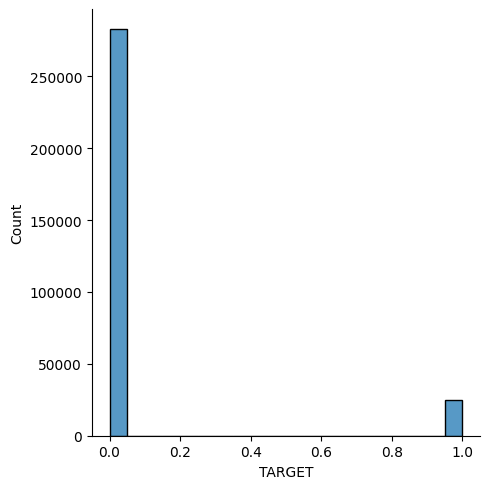

In [64]:
print("is TRAIN dataset balanced?")
sns.displot(trainDataset["TARGET"])

За аналізом отриманого графіку можна одразу сказати, що дані є незбалансованими. З цим можна боротись через oversampling, undersampling або synthetic samples, однак на лекціях згадувалось, що особливого результату така обробка даних не дала, тож працюватимемо з тим, що є.

In [65]:
trainDataset.hist(figsize = (100, 100))
print("TRAIN dataset graphs for features:")
plt.show

TRAIN dataset graphs for features:


<function matplotlib.pyplot.show(close=None, block=None)>

In [66]:
testDataset.hist(figsize = (100, 100))
print("TEST dataset graphs for features:")
plt.show

TEST dataset graphs for features:


<function matplotlib.pyplot.show(close=None, block=None)>

outliners for TRAIN dataset:


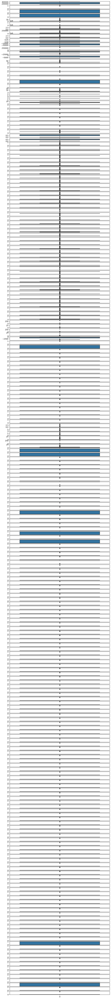

In [67]:
def outlierShow(data):
  fig, axes = plt.subplots(nrows=len(data.columns), ncols=1)
  fig.set_size_inches(10, 100)
  for i, col in enumerate(data.columns):
        sns.boxplot(data=data[col], ax=axes[i])
  plt.show()
  
print("outliners for TRAIN dataset:")
outlierShow(trainDataset)

outliners for TEST dataset:


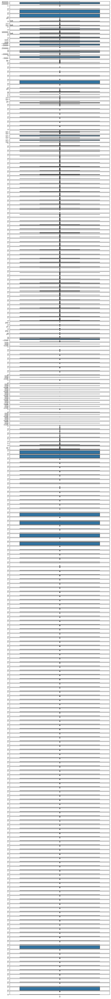

In [68]:
print("outliners for TEST dataset:")
outlierShow(testDataset)

#### Матриця кореляції

In [69]:
corelationPossible = 0.7
matrix = trainDataset.corr().abs()
top = matrix.where(np.triu(np.ones(matrix.shape), k=1).astype(bool))
columnsShort = [column for column in top.columns if any(top[column] >= corelationPossible)]

trainDataset = trainDataset.drop(columns = columnsShort)
testDataset = testDataset.drop(columns = columnsShort)
print(f"TRAIN dataset rows and collumns: {trainDataset.shape}")
print(f"TEST dataset rows and collumns: {testDataset.shape}")

TRAIN dataset rows and collumns: (307511, 193)
TEST dataset rows and collumns: (48744, 192)


In [70]:
def matrixCorrelation(data):
  matrix = data.corr()
  mask = np.array(matrix)
  mask[np.tril_indices_from(mask)] = False
  fig, ax = plt.subplots()
  fig.set_size_inches(100, 100)
  sns.heatmap(matrix, cmap = "Blues", mask = mask, vmax = 0.7, square = True, annot = True)
  plt.show()

print("correlation matrix for TRAIN dataset")
matrixCorrelation(trainDataset)

correlation matrix for TRAIN dataset


#### Логістична регресія на оброблених даних

In [71]:
trainPart = trainDataset.drop(columns = ["TARGET"])
from sklearn.model_selection import train_test_split
trainXVal, testXVal, trainYVal, testYVal = train_test_split(trainPart, trainDataset["TARGET"], test_size = 0.35)

from sklearn.preprocessing import StandardScaler
scaller = StandardScaler()
scTrainXVal = scaller.fit_transform(trainXVal)
scTestXVal = scaller.transform(testXVal)
scTest = scaller.transform(testDataset)

# class sklearn.linear_model.LogisticRegression(penalty='l2', *, dual=False, tol=0.0001, C=1.0, fit_intercept=True, intercept_scaling=1, class_weight=None, random_state=None, solver='lbfgs', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None, l1_ratio=None)
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
regr = LogisticRegression(class_weight = "balanced", max_iter = 1500, tol = 0.001)
regr.fit(scTrainXVal, trainYVal)
predictTrain = regr.predict(scTrainXVal)
print(f"TRAIN roc_auc: {roc_auc_score(trainYVal, predictTrain)}")
predictTest = regr.predict(scTestXVal)
print(f"TEST roc_auc: {roc_auc_score(testYVal, predictTest)}")

TRAIN roc_auc: 0.6850738522635174
TEST roc_auc: 0.674562497584521


In [75]:
predicted = regr.predict_proba(scTest)[:, 1]
testDataset = testDataset.astype({"SK_ID_CURR": int})
result = pd.DataFrame({
    "SK_ID_CURR": testDataset["SK_ID_CURR"],
    "TARGET": predicted
}).to_csv('submission.csv', index = False)